In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os, glob, random

from skimage.feature import graycomatrix, graycoprops

from tqdm import tqdm

import cv2
%matplotlib inline

pd.set_option('display.max_columns', None)

In [47]:
project_dir     = '/Users/k.choi/Documents/github/csiro_git'
data_dir        = os.path.join(project_dir, 'data')
img_dir         = os.path.join(data_dir, 'train')

In [48]:
img_list    = glob.glob(os.path.join(img_dir, '*.jpg'))
train_df    = pd.read_csv(os.path.join(data_dir, 'train.csv'))
columns     = train_df.columns; print(columns)
target_names  = train_df['target_name'].unique(); print(target_names)


Index(['sample_id', 'image_path', 'Sampling_Date', 'State', 'Species',
       'Pre_GSHH_NDVI', 'Height_Ave_cm', 'target_name', 'target'],
      dtype='object')
['Dry_Clover_g' 'Dry_Dead_g' 'Dry_Green_g' 'Dry_Total_g' 'GDM_g']


In [49]:
vegge = target_names[1]

num_samples = 10
sample_df  = train_df[train_df['target_name'] == vegge][['image_path', 'target']].copy()

low_df =  sample_df.nsmallest(num_samples, 'target').sample(1).iloc[0]
mid_df =  sample_df.iloc[ (sample_df['target'] - sample_df['target'].mean()).abs().argsort()[:num_samples] ].sample(1).iloc[0]
high_df = sample_df.nlargest(num_samples, 'target').sample(1).iloc[0]

sample_img_list = [ 
    { 'image_path': low_df['image_path'], 'target': low_df['target'], 'label': 'low' },
    { 'image_path': mid_df['image_path'], 'target': mid_df['target'], 'label': 'mid' },
    { 'image_path': high_df['image_path'], 'target': high_df['target'], 'label': 'high' },
]


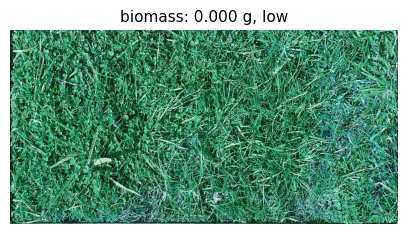

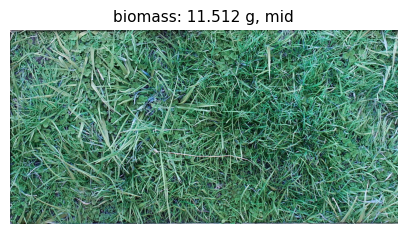

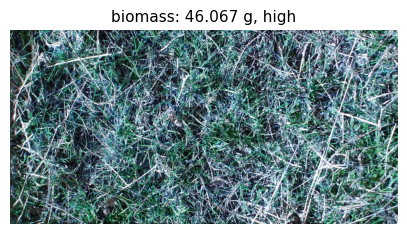

In [50]:
def img_show(path_, title_):
    img = cv2.imread(path_)
    plt.figure(figsize=(5, 3))
    plt.imshow(img)
    plt.title(title_, fontsize = 11)
    plt.axis('off')
    plt.show()

for i in range(3):

    paths = data_dir + '/' + sample_img_list[i]['image_path']
    title = f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}"

    img_show(paths, title)

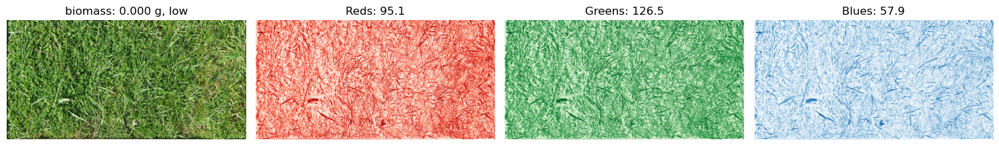

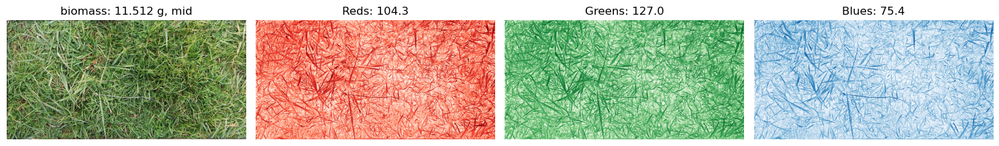

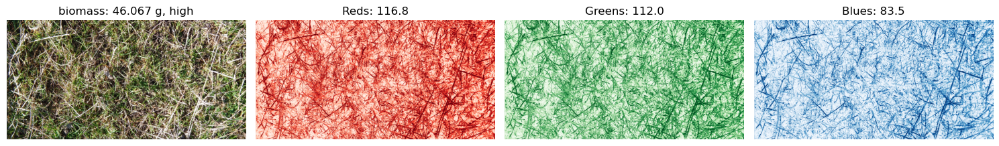

In [51]:

def get_rgb(path_): 
    return cv2.cvtColor(cv2.imread(path_), cv2.COLOR_BGR2RGB)

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')
    for j, c in enumerate(['Reds', 'Greens', 'Blues']):
        axes[j+1].imshow(img[:,:,j], cmap = c, vmin = 0, vmax = 255)
        axes[j+1].set_title(f"{c}: {img[:,:,j].mean():.1f}")
        axes[j+1].axis('off')
    plt.tight_layout(); plt.show()



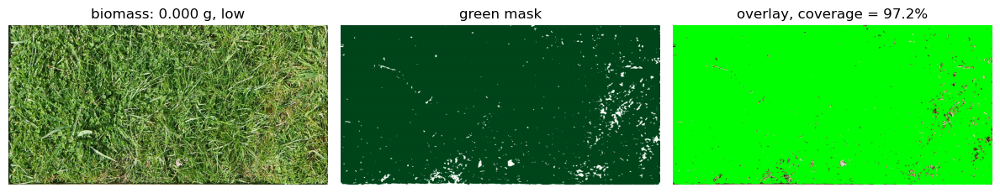

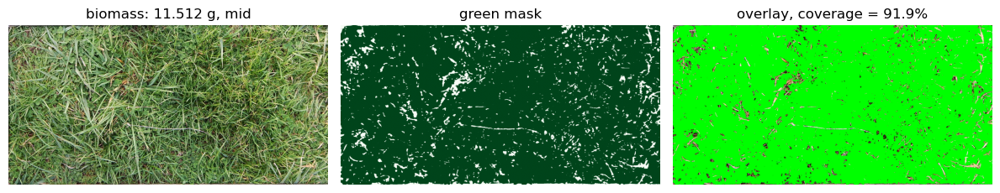

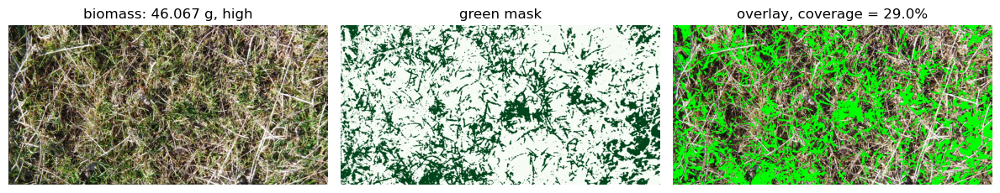

In [52]:

for i in range(3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    g_mask = (img[:,:,1] > img[:,:,0]) & (img[:,:,1] > img[:,:,2])
    axes[1].imshow(g_mask, cmap = 'Greens')
    axes[1].set_title('green mask')
    axes[1].axis('off')
    
    overlay = img.copy()
    overlay[g_mask] = [0, 255, 0]
    axes[2].imshow(overlay, cmap = 'Greens')
    axes[2].set_title(f'overlay, coverage = {g_mask.sum()*100/g_mask.size:.1f}%')
    axes[2].axis('off')

    plt.tight_layout(); plt.show()
         

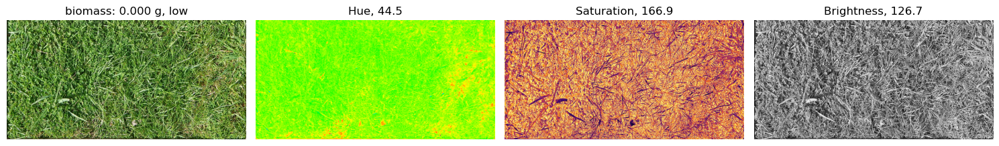

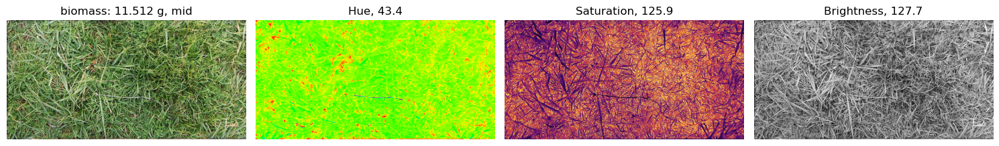

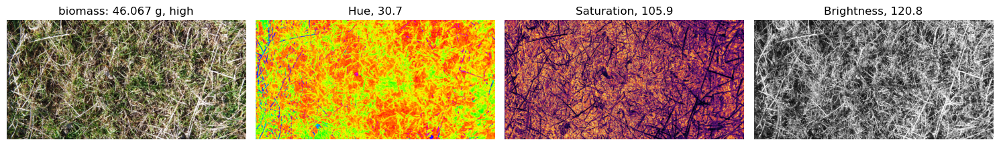

In [53]:
def get_hsv(path_):
    return cv2.cvtColor(cv2.imread(path_), cv2.COLOR_BGR2HSV)

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    for j, (c, cm) in enumerate(zip(['Hue', 'Saturation', 'Brightness'], ['hsv', 'inferno', 'gray'])):   
        axes[j+1].imshow(get_hsv(path)[:,:,j], cmap = cm)
        axes[j+1].set_title(f"{c}, {get_hsv(path)[:,:,j].mean():.1f}")
        axes[j+1].axis('off')
    plt.tight_layout(); plt.show()

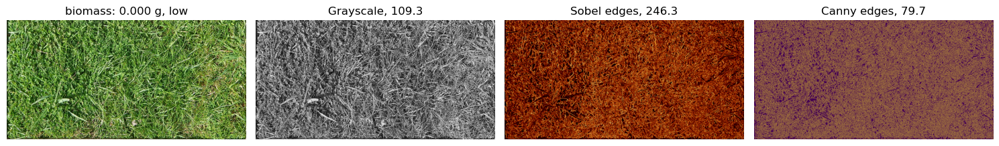

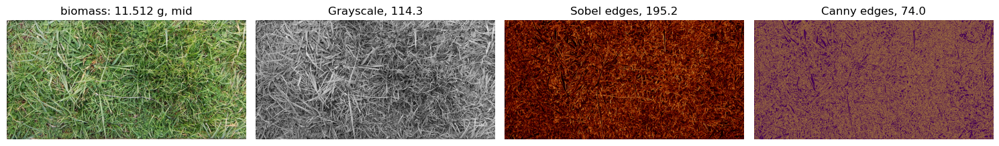

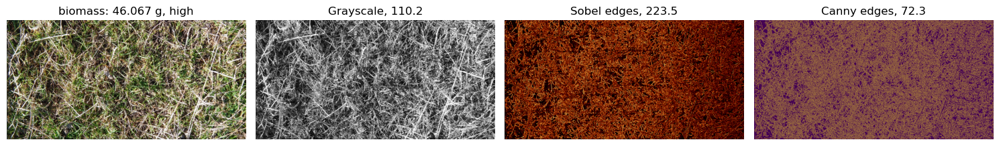

In [54]:
def get_gray(path_):
    return cv2.cvtColor(cv2.imread(path_), cv2.COLOR_BGR2GRAY)

def get_sobel(gray_):
    sobelx  = cv2.Sobel(gray_, cv2.CV_64F, 1, 0, ksize=3)
    sobely  = cv2.Sobel(gray_, cv2.CV_64F, 0, 1, ksize=3)
    return np.sqrt(sobelx**2 + sobely**2)

def get_canny(gray_): 
    return cv2.Canny(gray_, 100, 200) 

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    gray   = get_gray(path)
    sobel  = get_sobel(gray)
    canny  = get_canny(gray)

    img_arr = [gray, sobel, canny]; del gray, sobel, canny

    for j, (c, cm) in enumerate(zip(['Grayscale', 'Sobel edges', 'Canny edges'], ['gray', 'afmhot', 'viridis'])):
        axes[j+1].imshow(img_arr[j], cmap = cm)
        axes[j+1].set_title(f"{c}, {img_arr[j].mean():.1f}")
        axes[j+1].axis('off')
        
    plt.tight_layout(); plt.show()
    
    

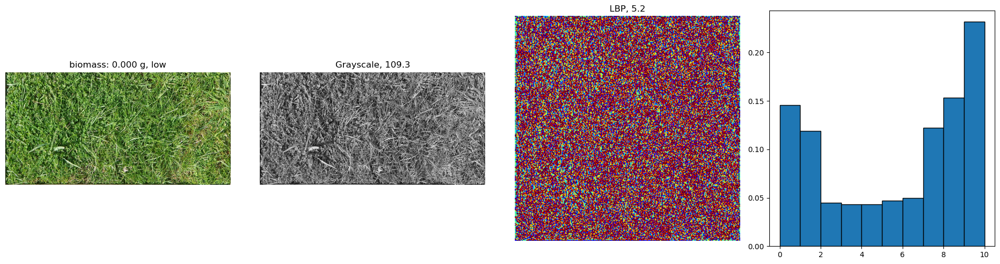

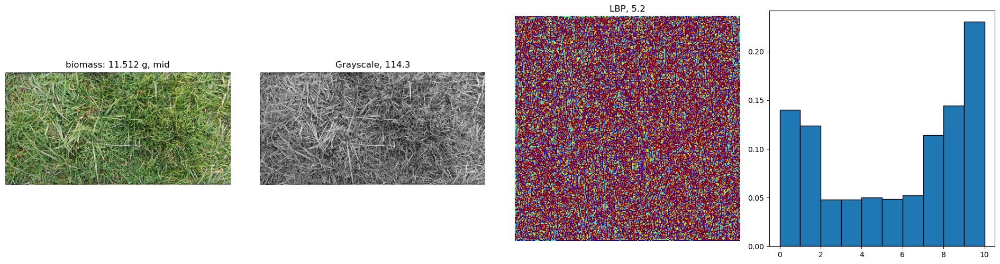

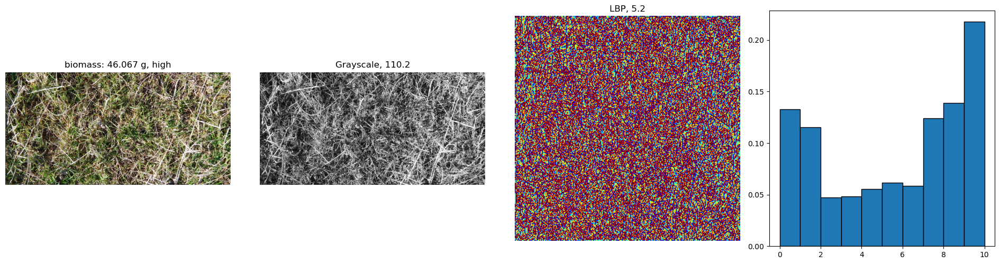

In [83]:
from skimage.feature import local_binary_pattern

def resized_img(img): 
    return cv2.resize(img, (256, 256))

def get_lbp(gray_):
    return local_binary_pattern(gray_, P=8, R=1, method="uniform")

for i in range(3):
    fig, axes = plt.subplots(1, 4, figsize=(19, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    # lbp  = get_lbp(gray)
    lbp  = get_lbp( resized_img(gray) )

    img_arr = [gray, lbp]
    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    for j, (c, cm) in enumerate(zip(['Grayscale', 'LBP'], ['gray', 'jet'])):
        axes[j+1].imshow(img_arr[j], cmap = cm)
        axes[j+1].set_title(f"{c}, {img_arr[j].mean():.1f}")
        axes[j+1].axis('off')
    
    nbins = int(np.unique(lbp.ravel()).max()) +1 
    axes[3].hist(lbp.ravel(), bins= nbins, range=(0, nbins), density=True, edgecolor='black', linewidth=1) 
    plt.tight_layout(); plt.show()




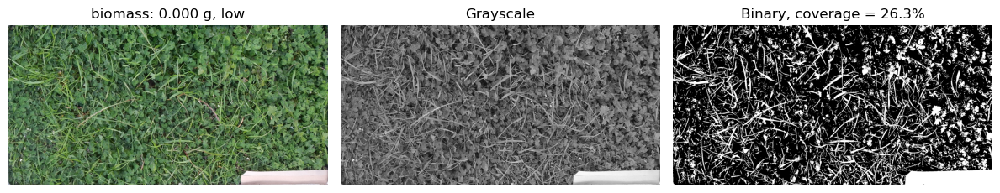

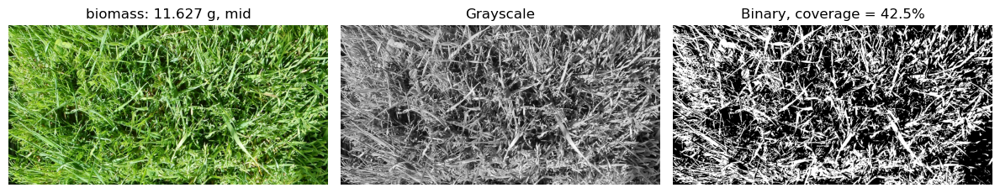

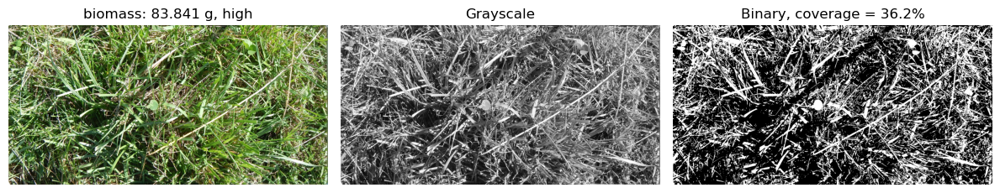

In [11]:
def get_binary(gray_):
    _, binary_ = cv2.threshold(gray_, 127, 255, cv2.THRESH_BINARY)
    if binary_.mean() > 127:
        binary = 255 - binary_
    return binary_

for i in range(3):

    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    binary = get_binary(gray)

    if binary.mean() > 127:
        binary = 255 - binary

    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    axes[1].imshow(gray, cmap = 'gray')
    axes[1].set_title('Grayscale')
    axes[1].axis('off')

    axes[2].imshow(binary, cmap = 'gray')
    axes[2].set_title(f'Binary, coverage = { (binary>0).sum()*100/binary.size:.1f}%')
    axes[2].axis('off')

    plt.tight_layout(); plt.show()


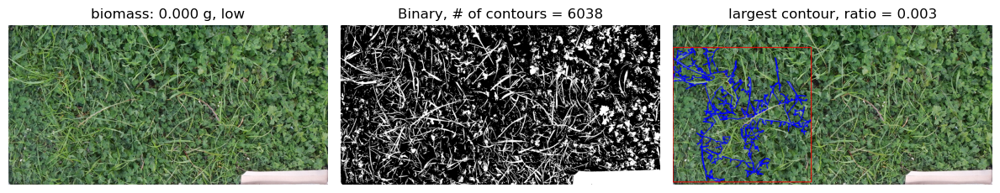

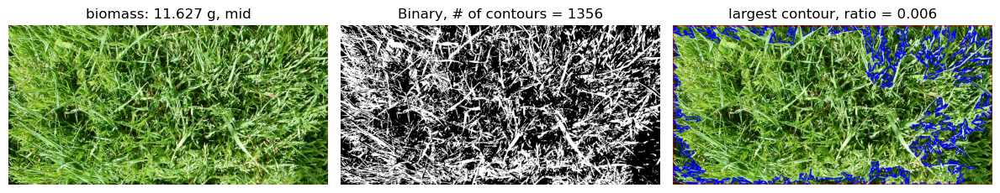

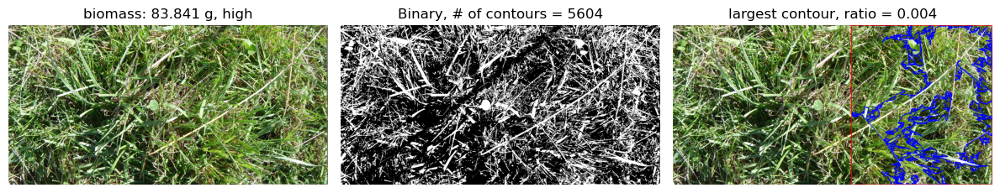

In [12]:
def get_contours(binary_):
    contours, _ = cv2.findContours(binary_, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

for i in range(3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    binary = get_binary(gray)
    contours = get_contours(binary)

    if len(contours) > 0:
        max_contour = max(contours, key=cv2.contourArea)

        area = cv2.contourArea(max_contour)
        perimeter = cv2.arcLength(max_contour, True)

        if perimeter > 0:
            ratio = 4 * np.pi * area / perimeter**2
        else:
            ratio = 0

        x, y, w, h = cv2.boundingRect(max_contour)

        img_contour = img.copy()
        cv2.drawContours(img_contour, [max_contour], -1, (0, 0, 255), 3)
        cv2.rectangle(img_contour, (x, y), (x+w, y+h), (255, 0, 0), 3)

    axes[0].imshow(img)
    axes[0].set_title(f"biomass: {sample_img_list[i]['target']:.3f} g, {sample_img_list[i]['label']}")
    axes[0].axis('off')

    axes[1].imshow(binary, cmap = 'gray')
    axes[1].set_title(f'Binary, # of contours = {len(contours)}')
    axes[1].axis('off')

    axes[2].imshow(img_contour, cmap = 'gray')
    axes[2].set_title(f'largest contour, ratio = {ratio:.3f}')
    axes[2].axis('off')
    plt.tight_layout(); plt.show()
    
    


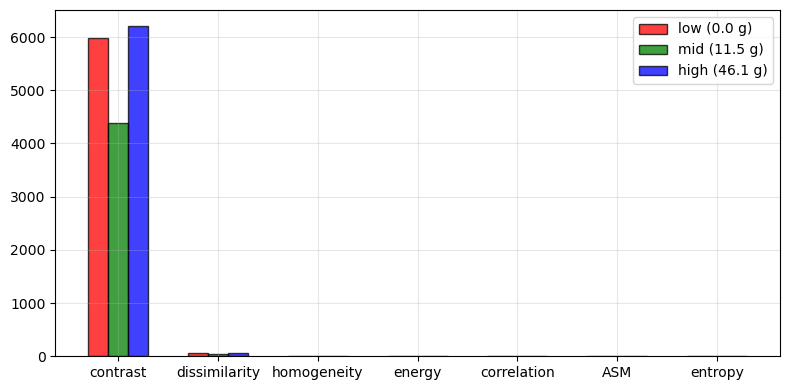

In [74]:
def get_glcm(gray_, distance = 1, angle = [0, np.pi/4, np.pi/2, 3*np.pi/4], levels = 256, symmetric = True, normed = True):
    return graycomatrix(gray_, distances=[distance], angles=angle, levels=levels, symmetric=symmetric, normed=normed)



glcm_prop = []
for i in range(3):
    path = data_dir + '/' + sample_img_list[i]['image_path']
    img  = get_rgb(path)
    gray = get_gray(path)
    glcm = get_glcm(resized_img(gray))

    properties = { 
        'label'         : sample_img_list[i]['label'],
        'target'        : sample_img_list[i]['target'],
        'contrast'      : graycoprops(glcm, 'contrast').mean(),
        'dissimilarity' : graycoprops(glcm, 'dissimilarity').mean(),
        'homogeneity'   : graycoprops(glcm, 'homogeneity').mean(),
        'energy'        : graycoprops(glcm, 'energy').mean(),
        'correlation'   : graycoprops(glcm, 'correlation').mean(),
        'ASM'           : graycoprops(glcm, 'ASM').mean(),
        'entropy'       : graycoprops(glcm, 'entropy').mean(),
    } 
    glcm_prop.append(properties)
glcm_df = pd.DataFrame(glcm_prop)

properties = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM', 'entropy']
x = np.arange(len(properties))
w = 0.2

fig, axes = plt.subplots(  figsize=(8, 4)) 
props = [ sample[p] for p in properties ]
colors = ['red', 'green', 'blue']

for j, (sample, color) in enumerate( zip(glcm_prop, colors) ):
    values = [ sample[p] for p in properties ]
    axes.bar( x + w * j, values, w , label = f'{sample["label"]} ({sample["target"]:.1f} g)' ,edgecolor='black', linewidth=1, color=color, alpha=0.75)
    axes.set_xticks( x + w ) 
    axes.grid(True, alpha=0.3)
    axes.set_xticklabels( properties )
    axes.legend(loc = 'upper right')

plt.tight_layout(); plt.show()

In [43]:
glcm_df.describe()

,target,contrast,dissimilarity,homogeneity,energy,correlation,ASM,entropy
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
mean,31.822600,1124.701639,19.394170,0.120974,0.010725,0.855258,0.000117,9.750619
std,45.422565,652.676819,5.629907,0.014374,0.001654,0.035855,0.000037,0.356951
min,0.000000,533.573797,13.649721,0.111236,0.009470,0.814631,0.000090,9.342459
25%,5.813550,774.488866,16.640215,0.112720,0.009788,0.841648,0.000096,9.623741
50%,11.627100,1015.403935,19.630710,0.114203,0.010106,0.868665,0.000103,9.905022
75%,47.733900,1420.265560,22.266395,0.125843,0.011353,0.875571,0.000131,9.954700
max,83.840700,1825.127185,24.902079,0.137483,0.012600,0.882477,0.000160,10.004377
